In [2]:
import gzip
from tqdm import tqdm
import json
import pandas as pd
import numpy as np
import networkx as nx
from networkx.algorithms import bipartite
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import datetime


In [2]:
with open('all_data.json' , 'r') as f:
    data = list(map(json.loads, f))

In [3]:
data

[{'overall': 5.0,
  'verified': True,
  'reviewerID': 'A2HOI48JK8838M',
  'asin': 'B00004U9V2',
  'reviewText': 'This handcream has a beautiful fragrance. It doesnt stay on or protect your hands through washing.  This size is quite small.',
  'summary': 'Beautiful Fragrance',
  'unixReviewTime': 1515110400,
  'category': 'Luxury_Beauty_5'},
 {'overall': 5.0,
  'verified': True,
  'reviewerID': 'AXBTO9HB020I7',
  'asin': 'B00014351Q',
  'reviewText': 'Very nice summer polish!',
  'summary': 'Five Stars',
  'unixReviewTime': 1472428800,
  'category': 'Luxury_Beauty_5'},
 {'overall': 1.0,
  'verified': True,
  'reviewerID': 'AUAI9MEBEBLL7',
  'asin': 'B00014340I',
  'reviewText': "This is almost white. Not nearly the pink they show in the picture. Won't buy polish on line again..",
  'summary': 'Took a chance',
  'unixReviewTime': 1519344000,
  'category': 'Luxury_Beauty_5'},
 {'overall': 5.0,
  'verified': True,
  'reviewerID': 'A1SFKLLC60TL69',
  'asin': 'B000142FVW',
  'reviewText': 'L

### convert into dataframe

In [4]:
rating = []
verified = []
user = []
asin = []
review = []
summary = []
time = []
category = []
for i in data:
    
    rating.append(i['overall'])
    verified.append(i['verified'])
    user.append(i['reviewerID'])
    asin.append(i['asin'])
    if 'reviewText' not in i:
        review.append(np.nan)
    else:
        review.append(i['reviewText'])
    if 'summary' not in i:
        summary.append(np.nan)
    else:
        summary.append(i['summary'])
    time.append(i['unixReviewTime'])
    category.append(i['category'][:-2])
df = pd.DataFrame({
                'rating':rating, 
                'verified': verified, 
                'user': user,
                'asin':asin,
                'review':review,
                'summary': summary,
                'time':time,
                'category': category
})

In [5]:
df

,rating,verified,user,asin,review,summary,time,category
0,5.0,True,A2HOI48JK8838M,B00004U9V2,This handcream has a beautiful fragrance. It d...,Beautiful Fragrance,1515110400,Luxury_Beauty
1,5.0,True,AXBTO9HB020I7,B00014351Q,Very nice summer polish!,Five Stars,1472428800,Luxury_Beauty
2,1.0,True,AUAI9MEBEBLL7,B00014340I,This is almost white. Not nearly the pink they...,Took a chance,1519344000,Luxury_Beauty
3,5.0,True,A1SFKLLC60TL69,B000142FVW,Love the color,Five Stars,1467676800,Luxury_Beauty
4,5.0,False,A96JD9312DHWC,B00014GT8W,I absolutely LOVE Dermablend makeup line. They...,A cover creme like no other,1501632000,Luxury_Beauty
...,...,...,...,...,...,...,...,...
340834,5.0,True,A22DOC6FT7ZHBZ,B01GKU5UJY,If you use rotary cutters like I no these are ...,Rulers grippers,1488412800,Arts_Crafts_and_Sewing
340835,5.0,False,AOGBL9Z3ZCKLC,B01GUFFQDE,Perfect set for card making. Very versatile fo...,Wonderful Variety,1536537600,Arts_Crafts_and_Sewing
340836,5.0,True,A2A13IGJ2U5QDO,B01H3GZ07G,NICE,Five Stars,1512086400,Arts_Crafts_and_Sewing
340837,1.0,False,A2PPSQHFAIRPV4,B01HB7JWKI,"Very upsetting, disappointing and embarrassing...",Very disappointing!!!,1508371200,Arts_Crafts_and_Sewing


In [6]:
df[df['review'].isnull() | df['summary'].isnull()]

,rating,verified,user,asin,review,summary,time,category
5944,3.0,True,A2BW265LP9RFVJ,B011R5FWN6,NaN,Three Stars,1506211200,Patio_Lawn_and_Garden
6850,5.0,True,A3SSGJMTJC7G6T,B001H9NV9A,NaN,Five Stars,1496707200,Patio_Lawn_and_Garden
8388,5.0,True,A2850SM9H6QERK,B001SICHU4,NaN,Five Stars,1462838400,Video_Games
8786,4.0,True,A2BY9TQ7LRUSBX,B0053BSNZU,Game is in good shape. Haven't had any problem...,NaN,1476835200,Video_Games
9061,5.0,True,A1BITOCNA3XPXL,B00BBF2TO8,great to use for different players,NaN,1486252800,Video_Games
...,...,...,...,...,...,...,...,...
335509,5.0,True,A2NKJJMSCWC8SG,B00BNVAYCE,NaN,"EZ to install. Use a 3/32"" pilot drill. Check ...",1517616000,Tools_and_Home_Improvement
335559,4.0,False,AAI1X9U5ASXY2,B00CY8BIZM,NaN,nice knife,1520812800,Tools_and_Home_Improvement
336558,5.0,True,A84ST4WZR91VW,B000BY4Q5K,NaN,Five Stars,1463097600,Arts_Crafts_and_Sewing
340267,5.0,True,A35JHP6O4H0WGU,B003A7O2O0,Great product.,NaN,1478995200,Arts_Crafts_and_Sewing


In [7]:
df.sort_values(by = 'time')

,rating,verified,user,asin,review,summary,time,category
176540,5.0,True,A1XYEOL5UI0A0V,B0181RA0OE,Great fit feels very natural to the grip. No ...,Great Cover,1451692800,Cell_Phones_and_Accessories
39377,5.0,True,A11ZVACM386LJY,B00A03KMC8,these are great. Stretchy and warm.,Five Stars,1451692800,Clothing_Shoes_and_Jewelry
36483,2.0,True,A3DROSWQQ3WGQG,B007UNSGB0,I liked this suitcase initially. When I packed...,Mine was a dud!,1451692800,Clothing_Shoes_and_Jewelry
147181,5.0,True,ANW0OTOGX9Q5B,B00R36755M,"Okay, I know it seems silly to buy a coozie fo...",It really is worth it!,1451692800,Home_and_Kitchen
137000,5.0,True,A3FJKWSI9KAGOB,B00E2563AU,Very nice!,Five Stars,1451692800,Home_and_Kitchen
...,...,...,...,...,...,...,...,...
168575,5.0,True,AIY6PIG4JN3JZ,B01HHHX64K,Really strong!,Five Stars,1538352000,Home_and_Kitchen
107998,3.0,True,A2HYXZO6AJYZ6W,B01H7HJEFK,ok for the price,just ok product,1538438400,Clothing_Shoes_and_Jewelry
168538,4.0,True,A1EBJGG8INODP3,B01H3S99M6,"As expected, works great, various sizes is a b...",Works great,1538438400,Home_and_Kitchen
107957,4.0,True,A1YI0K51WRRZ9H,B01H2L50JA,I wore these shoes for an 8+ hour day of cross...,Very comfortable for 8+ hours of training,1538438400,Clothing_Shoes_and_Jewelry


In [8]:
item_in_cat = df.groupby('category')['asin'].agg(set)
item_in_cat[:4]

category
AMAZON_FASHION            {B009MA34NY, B014IBJKNO, B005AGO4LU, B001IKJOL...
All_Beauty                {B00006L9LC, B000FI4S1E, B0009RF9DW, B0012Y0ZG...
Appliances                             {B0014CN8Y8, B0006GVNOA, B00MGMWTQS}
Arts_Crafts_and_Sewing    {B006P88WRE, B01CRNL4R0, B00RF4968Q, B001C1Y5F...
Name: asin, dtype: object

In [136]:
len(item_in_cat)

25

In [9]:
item_in_cat

category
AMAZON_FASHION                 {B009MA34NY, B014IBJKNO, B005AGO4LU, B001IKJOL...
All_Beauty                     {B00006L9LC, B000FI4S1E, B0009RF9DW, B0012Y0ZG...
Appliances                                  {B0014CN8Y8, B0006GVNOA, B00MGMWTQS}
Arts_Crafts_and_Sewing         {B006P88WRE, B01CRNL4R0, B00RF4968Q, B001C1Y5F...
Automotive                     {B00B7MRCM4, B019FIERRO, B005I5GLCS, B009BFBL9...
Cell_Phones_and_Accessories    {B006GCE5QQ, B00RNDRXIY, B00ING8KB4, B00JTDNCY...
Clothing_Shoes_and_Jewelry     {B01416ZH4M, B00LIM6W2Y, B0025ZPQXE, B00DJBCQX...
Digital_Music                  {B00122OUI8, B001GEOGIG, B003TKOJO6, B00L1SKW8...
Electronics                    {B000RL9RP6, B001OC5JKY, B003XINM2E, B00BWS34R...
Gift_Cards                     {B00MV9GCYQ, B01E4QUN0W, B00CXZPG0O, B005DHN6E...
Grocery_and_Gourmet_Food       {B00CLPUYTO, B00AX0CYWE, B006N0U0K6, B003ZUJ35...
Home_and_Kitchen               {B00440EKRG, B00TX79C1O, B0083UX3A8, B00L96BWT...
Industrial_and_Scie

### Check if item belong to multiple category

In [10]:
item_cat = df.groupby('asin')['category'].agg(set)
item_cat[:4]

asin
0101635370        {Electronics}
0140503528    {Office_Products}
0209688726         {Automotive}
0310802636    {Office_Products}
Name: category, dtype: object

In [11]:
sum(item_cat.apply(lambda x: len(x)) > 1)

0

In [12]:
item_cat = item_cat.apply(lambda x:x.pop())
item_cat

asin
0101635370                   Electronics
0140503528               Office_Products
0209688726                    Automotive
0310802636               Office_Products
0439499887               Office_Products
                         ...            
B01HJD4BBE    Clothing_Shoes_and_Jewelry
B01HJDGJ1E           Sports_and_Outdoors
B01HJF90LS    Tools_and_Home_Improvement
B01HJFFHTC                   Electronics
B01HJI17Y8                    Automotive
Name: category, Length: 251573, dtype: object

In [120]:
df.sort_values(by = 'time').iloc[-1]['time']

1538524800

In [1]:
class Simulation:
    def __init__(self, df):
        self.model = nx.Graph()
        self.df = df.sort_values(by = 'time')
        self.item_cat = df.groupby('asin')['category'].max()
    
    #min t: 1451692800 max t: 1538524800
    def add_node(self, t_start, t_end):
        df_part = self.df[(self.df['time'] >= t_start) & (self.df['time'] <= t_end)]
        '''
        user_added = set(df_part['user'])
        self.model.add_nodes_from([(node, {'category':'user'}) for node in user_added], bipartite=0)
        
        item_added = set(df_part[['asin', 'category']].itertuples(index=False, name=None))
        self.model.add_nodes_from([(node, {'category':category}) for (node, category) in item_added], bipartite=1)
        '''
        df_part['line_attr'] = df_part.apply(lambda x: {'time': x['time'], 'rating':x['rating']}, axis = 1)
        self.model.add_edges_from(df_part[['user','asin','line_attr']].itertuples(index=False, name=None))
        for i in self.model:
            if i in self.item_cat:
                self.model.nodes[i]['category'] = self.item_cat[i]
            else:
                self.model.nodes[i]['category'] = 'user'
            
    def get_sets(self):
        top_nodes = {n for n, d in self.model.nodes(data=True) if d["bipartite"] == 0}
        #bottom_nodes = set(self.model) - top_nodes
        return bipartite.sets(self.model, top_nodes)
    
    def get_color_pos(self):
        color_map = []
        pos = {}
        height = 0

        for i in self.model:
            cat = s.model.nodes[i]['category']
            
            if cat == 'user':
                last = i
            else:
                if i in s.model[last]:
                    height = (s.model[last][i]['time'] - 1451692800) / (5*864000)
                
            if  cat == 'user':
                color_map.append('xkcd:blue')
                pos[i] = (np.random.uniform(0,1), height)
            elif cat == 'AMAZON_FASHION':
                color_map.append('xkcd:red')
                pos[i] = (np.random.uniform(4,5), height)
            elif cat == 'All_Beauty':
                color_map.append('xkcd:coral')
                pos[i] = (np.random.uniform(4,5), height)
            elif cat == 'Appliances':
                color_map.append('xkcd:crimson')
                pos[i] = (np.random.uniform(4,5), height)
            elif cat == 'Arts_Crafts_and_Sewing':
                color_map.append('xkcd:cyan')
                pos[i] = (np.random.uniform(4,5), height)
            elif cat == 'Automotive':
                color_map.append('xkcd:beige')
                pos[i] = (np.random.uniform(4,5), height)
            elif cat == 'Cell_Phones_and_Accessories':
                color_map.append('xkcd:brown')
                pos[i] = (np.random.uniform(4,5), height)
            elif cat == 'Clothing_Shoes_and_Jewelry':
                color_map.append('xkcd:chartreuse')
                pos[i] = (np.random.uniform(4,5), height)
            elif cat == 'Digital_Music':
                color_map.append('xkcd:chocolate')
                pos[i] = (np.random.uniform(4,5), height)
            elif cat == 'Electronics':
                color_map.append('xkcd:darkgreen')
                pos[i] = (np.random.uniform(4,5), height)
            elif cat == 'Gift_Cards':
                color_map.append('xkcd:fuchsia')
                pos[i] = (np.random.uniform(4,5), height)
            elif cat == 'Grocery_and_Gourmet_Food':
                color_map.append('xkcd:gold')
                pos[i] = (np.random.uniform(4,5), height)
            elif cat == 'Home_and_Kitchen':
                color_map.append('xkcd:green')
                pos[i] = (np.random.uniform(4,5), height)
            elif cat == 'Industrial_and_Scientific':
                color_map.append('xkcd:grey')
                pos[i] = (np.random.uniform(4,5), height) 
            elif cat == 'Luxury_Beauty':
                color_map.append('xkcd:khaki')
                pos[i] = (np.random.uniform(4,5), height)
            elif cat == 'Magazine_Subscriptions':
                color_map.append('xkcd:lavender')
                pos[i] = (np.random.uniform(4,5), height)
            elif cat == 'Musical_Instruments':
                color_map.append('xkcd:lime')
                pos[i] = (np.random.uniform(4,5), height)
            elif cat == 'Office_Products':
                color_map.append('xkcd:olive')
                pos[i] = (np.random.uniform(4,5), height)
            elif cat == 'Patio_Lawn_and_Garden':
                color_map.append('xkcd:orange')
                pos[i] = (np.random.uniform(4,5), height)
                
            elif cat == 'Pet_Supplies':
                color_map.append('xkcd:orchid')
                pos[i] = (np.random.uniform(4,5), height)
            elif cat == 'Prime_Pantry':
                color_map.append('xkcd:purple')
                pos[i] = (np.random.uniform(4,5), height)
            elif cat == 'Software':
                color_map.append('xkcd:teal')
                pos[i] = (np.random.uniform(4,5), height)
            elif cat == 'Sports_and_Outdoors':
                color_map.append('xkcd:wheat')
                pos[i] = (np.random.uniform(4,5), height)
            elif cat == 'Tools_and_Home_Improvement':
                color_map.append('xkcd:yellow')
                pos[i] = (np.random.uniform(4,5), height)
            elif cat == 'Toys_and_Games':
                color_map.append('xkcd:aquamarine')
                pos[i] = (np.random.uniform(4,5), height)
                
            elif cat == 'Video_Games':
                color_map.append('xkcd:goldenrod')
                pos[i] = (np.random.uniform(4,5), height)
            else:
                raise Exception("class missing")
            
        return color_map, pos

    def draw(self, fig_size = (12,30), node_size = 2, width = 0.09, save = False):
        plt.figure(figsize = fig_size)
        color_map, pos = self.get_color_pos()
        nx.draw(self.model, node_size = node_size, pos = pos, width = width, node_color=color_map)
        if save:
            latest = self.df.iloc[-1]['time'] 
            
            dt = datetime.date.fromtimestamp(latest)
            plt.title("Until: {}".format(dt))
            plt.savefig('./plots/Amazon{}.png'.format(dt), bbox_inches='tight')
        '''nx.draw_networkx(
        self.model,
        pos = nx.drawing.layout.bipartite_layout(self.model, self.get_sets()[0]),
        node_size = 3,
        with_labels=False,
        width = 0.03)''' # Or whatever other display options you like
    

In [133]:

s = Simulation(df[['rating','user','asin','time','category']][:10000])
s.model.nodes()

NodeView(())

In [134]:
s.add_node(0, 1508524800)
s.model.edges()

      rating            user        asin        time               category
8715     5.0  A14DU1XG5WW3YN  B0050SWP96  1451692800            Video_Games
5090     5.0   AJH7L7I3CL53U  B00KMRHQNA  1451692800  Patio_Lawn_and_Garden
8713     5.0  A39IZFSBWWP9H4  B0050SVNZ8  1451692800            Video_Games
2903     3.0   AXOEP68E1WRBR  B003YL4MG0  1451692800  Patio_Lawn_and_Garden
8227     5.0  A1CPCXK1C9R6JM  B0012R58LG  1451692800            Video_Games
...      ...             ...         ...         ...                    ...
4883     5.0  A1RVOT4ZHPEEHS  B00ICFV0LS  1508371200  Patio_Lawn_and_Garden
8908     5.0   AUZVIRAWZYKXN  B006ZTHGCK  1508457600            Video_Games
8720     5.0  A2R03U5UAX219B  B0050SWTAQ  1508457600            Video_Games
4582     5.0  A277TW85S5GLG2  B00F8C0XLG  1508457600  Patio_Lawn_and_Garden
6105     5.0   AFD42SPKLWR2V  B015UU4PB4  1508457600  Patio_Lawn_and_Garden

[7966 rows x 5 columns]
[('A14DU1XG5WW3YN', 'B0050SWP96', {'time': 1451692800, 'rating'

/tmp/ipykernel_101/168067800.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_part['line_attr'] = df_part.apply(lambda x: {'time': x['time'], 'rating':x['rating']}, axis = 1)


EdgeView([('A14DU1XG5WW3YN', 'B0050SWP96'), ('B0050SWP96', 'A8NIZAIRT4EF7'), ('AJH7L7I3CL53U', 'B00KMRHQNA'), ('A39IZFSBWWP9H4', 'B0050SVNZ8'), ('B0050SVNZ8', 'A2P2QJXEQU5BIM'), ('B0050SVNZ8', 'A1J9G7HNVAH0D7'), ('B0050SVNZ8', 'A24HD3TRDRTNM9'), ('B0050SVNZ8', 'A27KRDZBELFVW4'), ('B0050SVNZ8', 'A3J5REDVI88HZO'), ('B0050SVNZ8', 'A2CCRGA7EVFTAC'), ('B0050SVNZ8', 'A3HL4FRUHM01A4'), ('AXOEP68E1WRBR', 'B003YL4MG0'), ('A1CPCXK1C9R6JM', 'B0012R58LG'), ('A167P2DHO7P5D7', 'B00R9NWEFK'), ('A396VHMYQHW5KE', 'B00RNDC6JU'), ('A3UTOJF5NHJI0Q', 'B00005O0I8'), ('A3B8SXBDWL1UFC', 'B00QLWZWMW'), ('A2PL7PSCA87CXN', 'B00FVVVSUY'), ('AAGT3SY5BDGOG', 'B001ELW98K'), ('A2C2F7L10X1QCI', 'B000R37S00'), ('A1ZSAWV7G5RSFW', 'B000HEB3UU'), ('A1ZSAWV7G5RSFW', 'B001V135P4'), ('A23N9PENVBQ6HC', 'B00CTOGJIW'), ('A20IBN6OIYFJQD', 'B007WQFKNC'), ('A1B7ZUQCAQB011', 'B00DNGQQUQ'), ('A2K2SRY22AEMGX', 'B001PKU5MW'), ('A3AP5XRC59REFB', 'B001B1OI0A'), ('A1XPYI1RPDQLNZ', 'B0097TM6AC'), ('A2JEFXZATFYV3K', 'B006ZUNKL0'), ('A2Y1IN

In [79]:
len(s.model.edges())

9489

In [49]:
s.model['A3N9FDER4SGFQU']

AtlasView({'B00HVMFAPK': {'time': 1451692800, 'rating': 5.0}})

In [18]:
s.model['A3N9FDER4SGFQU']['B00HVMFAPK']

{'time': 1451692800, 'rating': 5.0}

In [80]:
s.model.nodes(data = True)

NodeDataView({'A14DU1XG5WW3YN': {'category': 'user'}, 'B0050SWP96': {'category': 'Video_Games'}, 'AJH7L7I3CL53U': {'category': 'user'}, 'B00KMRHQNA': {'category': 'Patio_Lawn_and_Garden'}, 'A39IZFSBWWP9H4': {'category': 'user'}, 'B0050SVNZ8': {'category': 'Video_Games'}, 'AXOEP68E1WRBR': {'category': 'user'}, 'B003YL4MG0': {'category': 'Patio_Lawn_and_Garden'}, 'A1CPCXK1C9R6JM': {'category': 'user'}, 'B0012R58LG': {'category': 'Video_Games'}, 'A167P2DHO7P5D7': {'category': 'user'}, 'B00R9NWEFK': {'category': 'Video_Games'}, 'A396VHMYQHW5KE': {'category': 'user'}, 'B00RNDC6JU': {'category': 'Video_Games'}, 'A3UTOJF5NHJI0Q': {'category': 'user'}, 'B00005O0I8': {'category': 'Video_Games'}, 'A3B8SXBDWL1UFC': {'category': 'user'}, 'B00QLWZWMW': {'category': 'Video_Games'}, 'A2PL7PSCA87CXN': {'category': 'user'}, 'B00FVVVSUY': {'category': 'Video_Games'}, 'AAGT3SY5BDGOG': {'category': 'user'}, 'B001ELW98K': {'category': 'Patio_Lawn_and_Garden'}, 'A2C2F7L10X1QCI': {'category': 'user'}, 'B000R

In [62]:
s.model['B0068AD39Q']

AtlasView({'A396VHMYQHW5KE': {'time': 1451692800, 'rating': 5.0}})

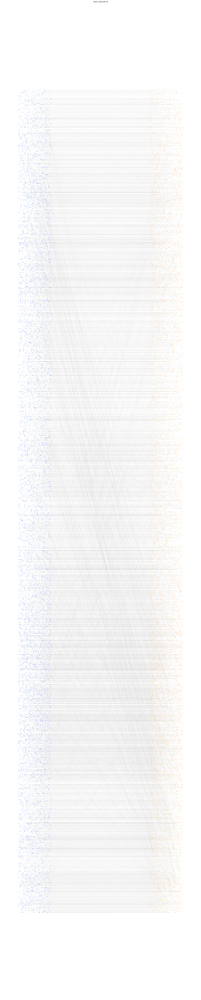

In [135]:
s.draw(fig_size = (20,100), width = 0.03, save = True)

In [141]:
np.random.normal(5 * 2,2,1)

array([12.34223067])

In [12]:
a = df[['user','asin']]
a.itertuples(index=False, name=None)

In [15]:
B = nx.Graph()
# Add nodes with the node attribute "bipartite"
B.add_nodes_from(set(df['user']), bipartite=0)
B.add_nodes_from(set(df['asin']), bipartite=1)
# Add edges only between nodes of opposite node sets
B.add_weighted_edges_from(df[['user','asin', 'rating']].itertuples(index=False, name=None))
nx.set_node_attributes(B, 0, "grain")

In [17]:
B.degree()

DegreeView({'AN29N32GWTAS7': 2, 'A1SWLG2I4N3WBD': 2, 'AZQHPD2ZZDBFQ': 1, 'A1NK51TAIRIO22': 1, 'A1UEM5L1TTVBH8': 1, 'A2I7RKPSG82235': 1, 'A2DM1LJC4XY3WA': 1, 'A3GFDD124WC2RL': 1, 'ANVI64EHZ91TV': 1, 'A3P38NOEKLR1ZA': 1, 'A3GQAITW2P8I4J': 2, 'A3J0QGYPUTLXLT': 1, 'A215XOVO0EUCUN': 1, 'AV81H8639LFNW': 1, 'A3MHE3KBBDXK19': 1, 'A2PVLXOIMGNBJ2': 1, 'A497RTKBZAU81': 2, 'A31N4KM03OSOA9': 1, 'A1YSN0FSI9VSSK': 1, 'A2GB4ZVB33T080': 1, 'A2SWMSK350P0GC': 1, 'A3GOUQIIW470Q': 1, 'A2OR511T0KYSM2': 1, 'AWXMNJM8Z3OTW': 1, 'AE93SSGDEKFGS': 1, 'ALTWGYENGM0EL': 1, 'A1PAACKPWJRKWU': 1, 'A3KN7WA5QYKU9P': 1, 'AW9CBJ5MPKU7G': 1, 'AD7CQMU5BLECN': 1, 'A1XPY29IA3W7GI': 2, 'A177WKMYK8DVX5': 1, 'A10NUS1Z3JH8Z1': 1, 'AJMIPYEONYSW8': 1, 'A12L02OG2JO6J8': 1, 'A28CK4RY72NI5T': 2, 'A2H6MKO7T82Z7Z': 1, 'A3CZJ74489VZIV': 1, 'A2N51ZAZZ2GL3W': 1, 'AM54L2VVKBQZO': 2, 'A1GUFHXIMJAXJG': 1, 'A1PJBTPGEFJT2C': 1, 'AK75SMWG80BGL': 2, 'A1J5B2YQZN7F9R': 1, 'A3PBDS2II8XASD': 2, 'A2DYCAADFDVYHZ': 2, 'A1WSFMK1F2ZRFH': 2, 'ADLS8DPS0RIMY'